In [ ]:
import pandas as pd
import numpy as np

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/new_dataset/spelling_correct_with_removeNumber - spelling_correct_with_removeNumber.csv')
df

,sentence,labels
0,in going to go,0
1,in going to say goodby to the drugstore,0
2,i think that this is the way it should be done...,0
3,in going to join you,0
4,its illegal,0
...,...,...
25565,i saw that there are people like musfakur him ...,0
25566,papa she is trying to avoid responsibility here,0
25567,said needs the bangladesh team,0
25568,you keep going we ll take your shot,0


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.9/67.9 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 34.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.5/897.5 kB 53.9 MB/s eta 0:00:00
  Attempting uninstall: transformers
    Found existing installation: transformers 4.46.3
    Uninstalling transformers-4.46.3:
      Successfully uninstalled transformers-4.46.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentence-transformers 3.2.1 requires transformers<5.0.0,>=4.41.0, but you have transformers 4.17.0 which is incompatible.


Downloading:   0%|          | 0.00/972k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/625 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/681M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:1439: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(resolved_archive_file, map

Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall
1,0.294800,0.282194,0.889715,0.899429,0.941748,0.860751
2,0.274500,0.246982,0.904380,0.913650,0.946579,0.882935
3,0.181300,0.265715,0.907509,0.916475,0.949506,0.885666
4,0.155100,0.282526,0.904185,0.915981,0.920400,0.911604
5,0.123600,0.285963,0.899883,0.913279,0.906523,0.920137
6,0.104000,0.373028,0.892648,0.908849,0.884901,0.934130
7,0.040500,0.413586,0.902620,0.914256,0.922516,0.906143
8,0.088100,0.432201,0.900469,0.913450,0.910200,0.916724


***** Running Evaluation *****
  Num examples = 5114
  Batch size = 32
Saving model checkpoint to ./results/checkpoint-640
Configuration saved in ./results/checkpoint-640/config.json
Model weights saved in ./results/checkpoint-640/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 5114
  Batch size = 32
Saving model checkpoint to ./results/checkpoint-1280
Configuration saved in ./results/checkpoint-1280/config.json
Model weights saved in ./results/checkpoint-1280/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 5114
  Batch size = 32
Saving model checkpoint to ./results/checkpoint-1920
Configuration saved in ./results/checkpoint-1920/config.json
Model weights saved in ./results/checkpoint-1920/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 5114
  Batch size = 32
Saving model checkpoint to ./results/checkpoint-2560
Configuration saved in ./results/checkpoint-2560/config.json
Model weights saved in ./results/checkpoint-2560/pytorch_model

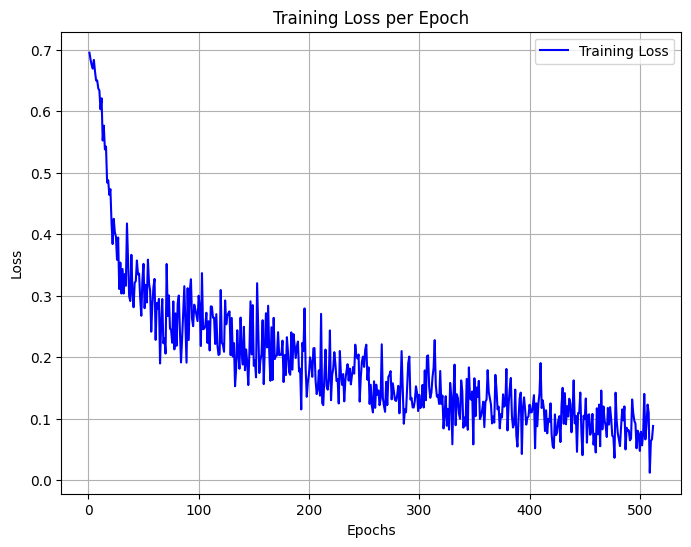

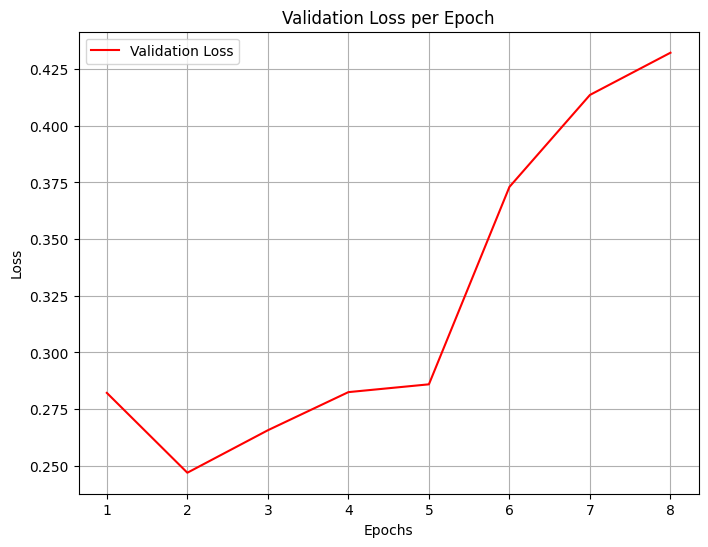

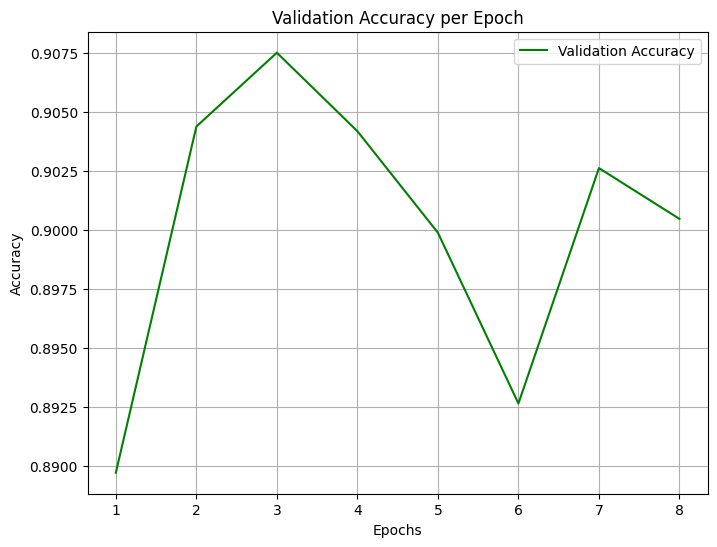

In [ ]:
# Install necessary libraries
!pip install transformers==4.17 matplotlib pandas scikit-learn torch

# Import libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, precision_recall_fscore_support
from transformers import BertTokenizer, BertForSequenceClassification, Trainer, TrainingArguments, TrainerCallback
import torch
import os
import matplotlib.pyplot as plt
import pandas as pd

# Split into training and testing datasets
train_texts, test_texts, train_labels, test_labels = train_test_split(
    df['sentence'], df['labels'], test_size=0.2, random_state=42
)

# Load the tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-multilingual-cased')

# Tokenize the training and testing data
train_encodings = tokenizer(train_texts.astype(str).tolist(), truncation=True, padding=True, max_length=128)
test_encodings = tokenizer(test_texts.astype(str).tolist(), truncation=True, padding=True, max_length=128)

# Define a custom dataset class
class HateSpeechDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = pd.to_numeric(labels, errors='coerce').fillna(0).astype(int).tolist()

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

# Create the datasets
train_dataset = HateSpeechDataset(train_encodings, train_labels)
test_dataset = HateSpeechDataset(test_encodings, test_labels)

# Disable WandB logging
os.environ["WANDB_DISABLED"] = "true"

# Define the compute_metrics function
def compute_metrics(p):
    preds = p.predictions.argmax(axis=1)
    precision, recall, f1, _ = precision_recall_fscore_support(p.label_ids, preds, average='binary')
    acc = accuracy_score(p.label_ids, preds)
    return {
        'accuracy': acc,
        'f1': f1,
        'precision': precision,
        'recall': recall
    }

# Initialize the model
model = BertForSequenceClassification.from_pretrained('bert-base-multilingual-cased', num_labels=2)

# Set up the training arguments
training_args = TrainingArguments(
    output_dir='./results',
    num_train_epochs=8,
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    warmup_steps=500,
    weight_decay=0.01,
    max_grad_norm=1.0,
    logging_dir='./logs',
    logging_steps=10,
    evaluation_strategy="epoch",  # Evaluate at the end of each epoch
    save_strategy="epoch",       # Save the model at the end of each epoch
    learning_rate=1e-5,
    lr_scheduler_type="linear",
    load_best_model_at_end=True,
    metric_for_best_model='f1',
    disable_tqdm=False
)

# Define a custom callback to capture metrics per epoch
class MetricsHistoryCallback(TrainerCallback):
    def __init__(self):
        self.train_losses = []
        self.eval_losses = []
        self.eval_accuracies = []

    def on_log(self, args, state, control, logs=None, **kwargs):
        if logs:
            if "loss" in logs:
                self.train_losses.append(logs["loss"])
            if "eval_loss" in logs:
                self.eval_losses.append(logs["eval_loss"])
            if "eval_accuracy" in logs:
                self.eval_accuracies.append(logs["eval_accuracy"])

# Initialize the custom callback
metrics_callback = MetricsHistoryCallback()

# Initialize the Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    compute_metrics=compute_metrics,
    callbacks=[metrics_callback]
)

# Train the model
trainer.train()

# Plot Training Loss
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(metrics_callback.train_losses) + 1), metrics_callback.train_losses, label='Training Loss', color='blue')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

# Plot Validation Loss
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(metrics_callback.eval_losses) + 1), metrics_callback.eval_losses, label='Validation Loss', color='red')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

# Plot Validation Accuracy
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(metrics_callback.eval_accuracies) + 1), metrics_callback.eval_accuracies, label='Validation Accuracy', color='green')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Validation Accuracy per Epoch')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Get predictions on the test dataset
predictions = trainer.predict(test_dataset)

# Convert logits to predicted class labels
predicted_labels = predictions.predictions.argmax(axis=1)

# Generate the classification report
report = classification_report(test_labels, predicted_labels, target_names=['Class 0', 'Class 1'])

# Print the report
print("Classification Report:\n")
print(report)


***** Running Prediction *****
  Num examples = 5114
  Batch size = 32


Classification Report:

              precision    recall  f1-score   support

     Class 0       0.86      0.94      0.90      2184
     Class 1       0.95      0.89      0.92      2930

    accuracy                           0.91      5114
   macro avg       0.90      0.91      0.91      5114
weighted avg       0.91      0.91      0.91      5114



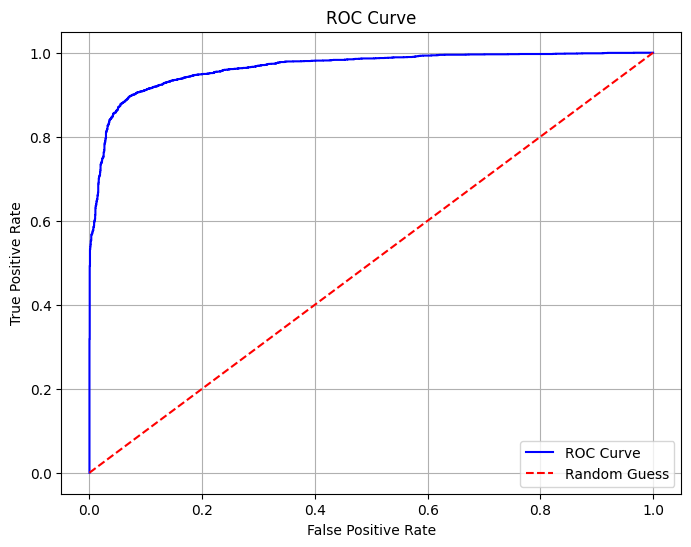

In [ ]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

# Get predicted probabilities (softmax logits)
probabilities = torch.softmax(torch.tensor(predictions.predictions), dim=1).numpy()

# Extract probabilities for the positive class
positive_class_probs = probabilities[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(test_labels, positive_class_probs)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC Curve', color='blue')
plt.plot([0, 1], [0, 1], 'r--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


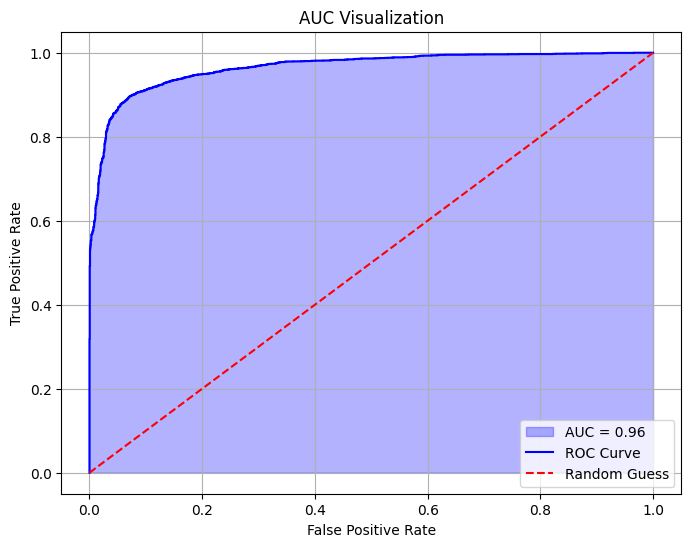

AUC Score: 0.96


In [ ]:
from sklearn.metrics import roc_auc_score

# Calculate AUC
auc_score = roc_auc_score(test_labels, positive_class_probs)

# Visualize the AUC as a shaded area
plt.figure(figsize=(8, 6))
plt.fill_between(fpr, tpr, alpha=0.3, color='blue', label=f'AUC = {auc_score:.2f}')
plt.plot(fpr, tpr, color='blue', label='ROC Curve')
plt.plot([0, 1], [0, 1], 'r--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC Visualization')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# Print the AUC score
print(f"AUC Score: {auc_score:.2f}")


In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 9.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=d8ee17059a8f7786c38ffec2d64c547606233587c91a2738b551ea1266eb317c
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


First 10 sentences from the test set:
1: money hoes and clothes
2: it chaantellie beyonc seems like a bitch
3: oh you want who well saimigi is hetty who eat that shit since in broke
4: thatvibe bitch in wretched writers i do what i want
5: sake such tears with his face and never seen bangladesh give away his wishes if you dont remove him from the bc then the bengal tigers will be happy and sin will break their hands in the daytime so you can get back to you without retiring said brother you
6: did la mulatta just refer to herself as a dark thejournalista hung gwarbucks ingress
7: up early then a bitch driving to benton org can i move already
8: like bitch y u aunt do that in the first place
9: youngricooo wexicanafro dont take advantage of a nice person hoes everyjuan
10: i like to see your brother and sister

Generating LIME explanation for sentence 1:
"money hoes and clothes"



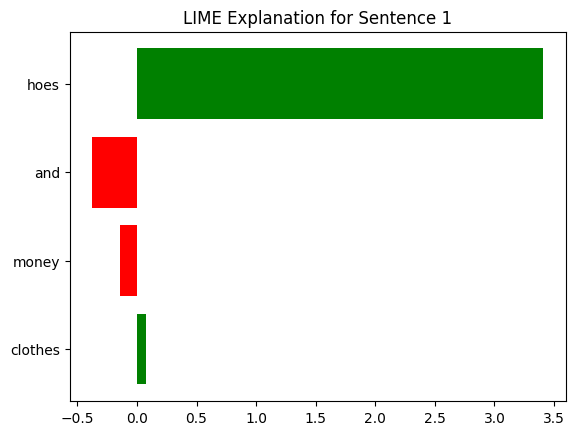


Generating LIME explanation for sentence 2:
"it chaantellie beyonc seems like a bitch"



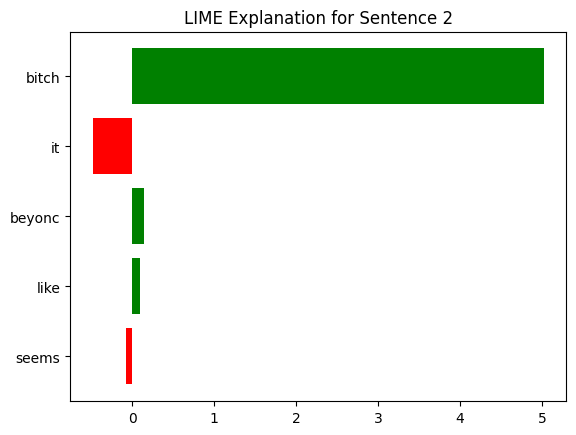


Generating LIME explanation for sentence 3:
"oh you want who well saimigi is hetty who eat that shit since in broke"



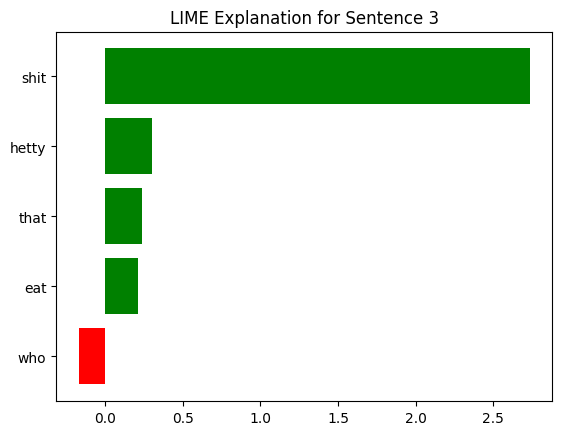


Generating LIME explanation for sentence 4:
"thatvibe bitch in wretched writers i do what i want"



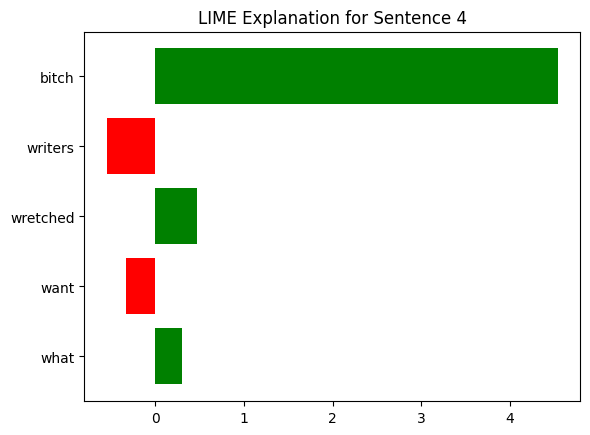


Generating LIME explanation for sentence 5:
"sake such tears with his face and never seen bangladesh give away his wishes if you dont remove him from the bc then the bengal tigers will be happy and sin will break their hands in the daytime so you can get back to you without retiring said brother you"



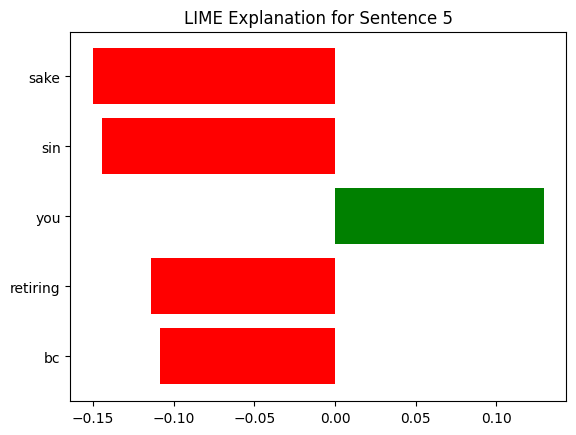


Generating LIME explanation for sentence 6:
"did la mulatta just refer to herself as a dark thejournalista hung gwarbucks ingress"



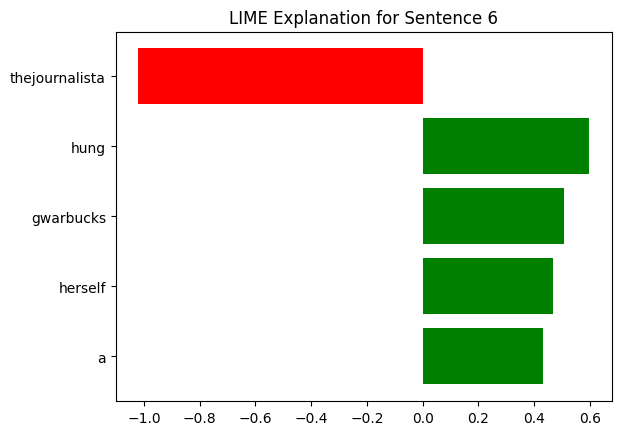


Generating LIME explanation for sentence 7:
"up early then a bitch driving to benton org can i move already"



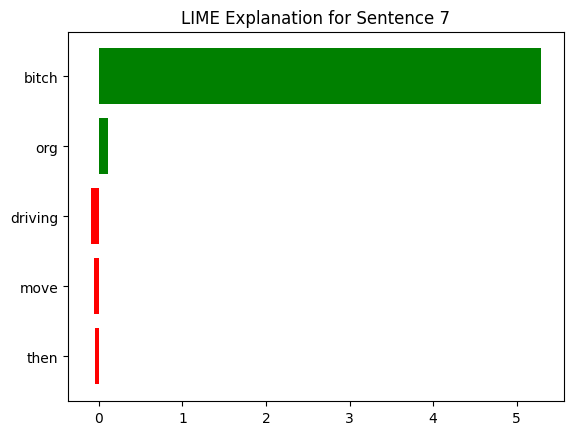


Generating LIME explanation for sentence 8:
"like bitch y u aunt do that in the first place"



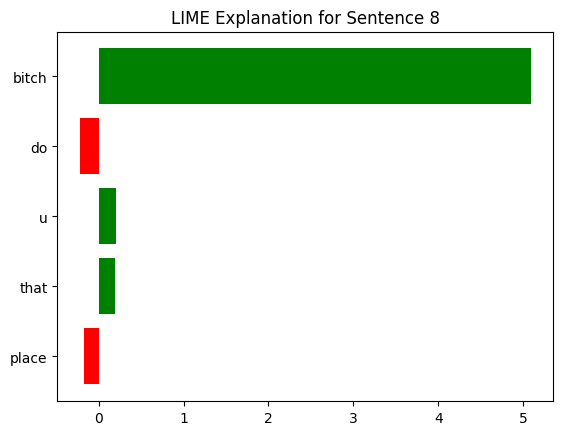


Generating LIME explanation for sentence 9:
"youngricooo wexicanafro dont take advantage of a nice person hoes everyjuan"



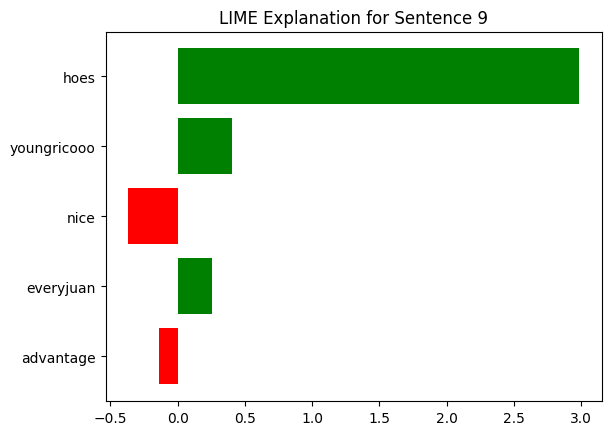


Generating LIME explanation for sentence 10:
"i like to see your brother and sister"



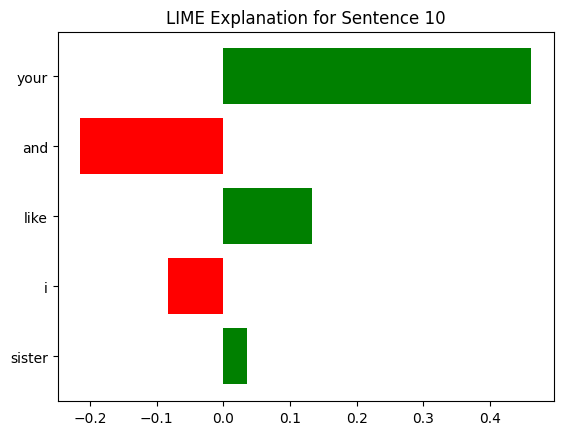

In [ ]:
# Import required libraries
from lime.lime_text import LimeTextExplainer
import numpy as np
import torch
import gc
import matplotlib.pyplot as plt

# Clear unused variables and GPU memory
if 'sample_texts' in locals():
    del sample_texts
if 'fig' in locals():
    del fig

gc.collect()
torch.cuda.empty_cache()

# Define a prediction function for LIME
def predict_fn(texts):
    # Tokenize input texts
    encodings = tokenizer(texts, truncation=True, padding=True, max_length=128, return_tensors="pt")
    # Move tensors to the same device as the model
    with torch.no_grad():
        outputs = model(**{key: val.to(model.device) for key, val in encodings.items()})
    # Move logits to CPU before converting to NumPy array
    return outputs.logits.cpu().numpy()

# Initialize the LIME text explainer
explainer = LimeTextExplainer(class_names=['Not Hate Speech', 'Hate Speech'])

# Display 10 sentences from the test set
print("First 10 sentences from the test set:")
test_sentences = test_texts.tolist()[:10]  # Convert test_texts to a list and slice the first 10 sentences
for idx, sentence in enumerate(test_sentences, start=1):
    print(f"{idx}: {sentence}")

# Generate and display explanations for each sentence
for idx, text_to_explain in enumerate(test_sentences, start=1):
    print(f"\nGenerating LIME explanation for sentence {idx}:")
    print(f"\"{text_to_explain}\"\n")

    # Generate LIME explanation
    exp = explainer.explain_instance(
        text_to_explain, predict_fn, num_features=5, num_samples=500
    )

    # Show the explanation in the notebook
    exp.show_in_notebook(text=True)

    # Optionally visualize the explanation as a plot
    fig = exp.as_pyplot_figure()
    plt.title(f'LIME Explanation for Sentence {idx}')
    plt.show()
